# Micro-Credit Defaulter Model

### Problem Statement: 

A Microfinance Institution (MFI) is an organization that offers financial services to low income populations. MFS becomes very useful when targeting especially the unbanked poor families living in remote areas with not much sources of income. The Microfinance services (MFS) provided by MFI are Group Loans, Agricultural Loans, Individual Business Loans and so on. 

Many microfinance institutions (MFI), experts and donors are supporting the idea of using mobile financial services (MFS) which they feel are more convenient and efficient, and cost saving, than the traditional high-touch model used since long for the purpose of delivering microfinance services. Though, the MFI industry is primarily focusing on low income families and are very useful in such areas, the implementation of MFS has been uneven with both significant challenges and successes.

Today, microfinance is widely accepted as a poverty-reduction tool, representing $70 billion in outstanding loans and a global outreach of 200 million clients.

We are working with one such client that is in Telecom Industry. They are a fixed wireless telecommunications network provider. They have launched various products and have developed its business and organization based on the budget operator model, offering better products at Lower Prices to all value conscious customers through a strategy of disruptive innovation that focuses on the subscriber. 

They understand the importance of communication and how it affects a person’s life, thus, focusing on providing their services and products to low income families and poor customers that can help them in the need of hour. 

They are collaborating with an MFI to provide micro-credit on mobile balances to be paid back in 5 days. The Consumer is believed to be defaulter if he deviates from the path of paying back the loaned amount within the time duration of 5 days. For the loan amount of 5 (in Indonesian Rupiah), payback amount should be 6 (in Indonesian Rupiah), while, for the loan amount of 10 (in Indonesian Rupiah), the payback amount should be 12 (in Indonesian Rupiah). 

The sample data is provided to us from our client database. It is hereby given to you for this exercise. In order to improve the selection of customers for the credit, the client wants some predictions that could help them in further investment and improvement in selection of customers.


### Importing the needed Libraries

In [1]:
# Importing Libraries

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import time
from datetime import datetime
pd.set_option('display.max_columns',None)
pd.set_option('display.max_rows',None)
import warnings
warnings.filterwarnings('ignore')
from scipy.stats import zscore

# Machine Learning library

from sklearn.preprocessing import PowerTransformer
from sklearn.preprocessing import MinMaxScaler
from sklearn.linear_model import LogisticRegression,SGDClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from xgboost import XGBClassifier
from sklearn.model_selection import train_test_split,GridSearchCV,cross_val_score,KFold
from sklearn.metrics import confusion_matrix,classification_report,f1_score,accuracy_score,roc_auc_score,roc_curve
from imblearn.over_sampling import SMOTE
from statsmodels.stats.outliers_influence import variance_inflation_factor
from sklearn.ensemble import RandomForestClassifier,AdaBoostClassifier,GradientBoostingClassifier,BaggingClassifier
from collections import Counter
from imblearn.combine import SMOTETomek

### Data Assessing

In [2]:
# Loading the data set
df=pd.read_csv(r'C:\Users\JAYASHRI\Downloads\Micro-Credit-Project--1-\Micro Credit Project\Data file.csv')
df.head(10)

,Unnamed: 0,label,msisdn,aon,daily_decr30,daily_decr90,rental30,rental90,last_rech_date_ma,last_rech_date_da,last_rech_amt_ma,cnt_ma_rech30,fr_ma_rech30,sumamnt_ma_rech30,medianamnt_ma_rech30,medianmarechprebal30,cnt_ma_rech90,fr_ma_rech90,sumamnt_ma_rech90,medianamnt_ma_rech90,medianmarechprebal90,cnt_da_rech30,fr_da_rech30,cnt_da_rech90,fr_da_rech90,cnt_loans30,amnt_loans30,maxamnt_loans30,medianamnt_loans30,cnt_loans90,amnt_loans90,maxamnt_loans90,medianamnt_loans90,payback30,payback90,pcircle,pdate
0,1,0,21408I70789,272.0,3055.050000,3065.150000,220.13,260.13,2.0,0.0,1539,2,21.0,3078.0,1539.0,7.50,2,21,3078,1539.0,7.50,0.0,0.0,0,0,2,12,6.0,0.0,2.0,12,6,0.0,29.000000,29.000000,UPW,2016-07-20
1,2,1,76462I70374,712.0,12122.000000,12124.750000,3691.26,3691.26,20.0,0.0,5787,1,0.0,5787.0,5787.0,61.04,1,0,5787,5787.0,61.04,0.0,0.0,0,0,1,12,12.0,0.0,1.0,12,12,0.0,0.000000,0.000000,UPW,2016-08-10
2,3,1,17943I70372,535.0,1398.000000,1398.000000,900.13,900.13,3.0,0.0,1539,1,0.0,1539.0,1539.0,66.32,1,0,1539,1539.0,66.32,0.0,0.0,0,0,1,6,6.0,0.0,1.0,6,6,0.0,0.000000,0.000000,UPW,2016-08-19
3,4,1,55773I70781,241.0,21.228000,21.228000,159.42,159.42,41.0,0.0,947,0,0.0,0.0,0.0,0.00,1,0,947,947.0,2.50,0.0,0.0,0,0,2,12,6.0,0.0,2.0,12,6,0.0,0.000000,0.000000,UPW,2016-06-06
4,5,1,03813I82730,947.0,150.619333,150.619333,1098.90,1098.90,4.0,0.0,2309,7,2.0,20029.0,2309.0,29.00,8,2,23496,2888.0,35.00,0.0,0.0,0,0,7,42,6.0,0.0,7.0,42,6,0.0,2.333333,2.333333,UPW,2016-06-22
5,6,1,35819I70783,568.0,2257.362667,2261.460000,368.13,380.13,2.0,0.0,1539,4,10.0,6156.0,1539.0,15.40,8,0,11744,1539.0,55.90,0.0,0.0,0,0,3,18,6.0,0.0,3.0,18,6,0.0,11.000000,8.333333,UPW,2016-07-02
6,7,1,96759I84459,545.0,2876.641667,2883.970000,335.75,402.90,13.0,0.0,5787,1,0.0,5787.0,5787.0,277.80,1,0,5787,5787.0,277.80,0.0,0.0,0,0,1,6,6.0,0.0,1.0,6,6,0.0,0.000000,0.000000,UPW,2016-07-05
7,8,1,09832I90846,768.0,12905.000000,17804.150000,900.35,2549.11,4.0,55.0,3178,3,3.0,10404.0,3178.0,36.00,9,3,26095,3178.0,36.00,0.0,0.0,1,0,3,18,6.0,0.0,7.0,42,6,0.0,6.000000,3.857143,UPW,2016-08-05
8,9,1,59772I84450,1191.0,90.695000,90.695000,2287.50,2287.50,1.0,0.0,1539,4,1.0,6164.0,1539.0,39.90,4,1,6164,1539.0,39.90,0.0,0.0,0,0,4,24,6.0,0.0,4.0,24,6,0.0,2.666667,2.666667,UPW,2016-06-15
9,10,1,56331I70783,536.0,29.357333,29.357333,612.96,612.96,11.0,0.0,773,1,0.0,773.0,773.0,86.80,1,0,773,773.0,86.80,0.0,0.0,0,0,1,6,6.0,0.0,1.0,6,6,0.0,0.000000,0.000000,UPW,2016-06-08


In [3]:
# Checking the shape of the data set
df.shape

(209593, 37)

In [4]:
# Checking any null value present in dataset

df.isnull().sum()

Unnamed: 0              0
label                   0
msisdn                  0
aon                     0
daily_decr30            0
daily_decr90            0
rental30                0
rental90                0
last_rech_date_ma       0
last_rech_date_da       0
last_rech_amt_ma        0
cnt_ma_rech30           0
fr_ma_rech30            0
sumamnt_ma_rech30       0
medianamnt_ma_rech30    0
medianmarechprebal30    0
cnt_ma_rech90           0
fr_ma_rech90            0
sumamnt_ma_rech90       0
medianamnt_ma_rech90    0
medianmarechprebal90    0
cnt_da_rech30           0
fr_da_rech30            0
cnt_da_rech90           0
fr_da_rech90            0
cnt_loans30             0
amnt_loans30            0
maxamnt_loans30         0
medianamnt_loans30      0
cnt_loans90             0
amnt_loans90            0
maxamnt_loans90         0
medianamnt_loans90      0
payback30               0
payback90               0
pcircle                 0
pdate                   0
dtype: int64

In [5]:
df.columns

Index(['Unnamed: 0', 'label', 'msisdn', 'aon', 'daily_decr30', 'daily_decr90',
       'rental30', 'rental90', 'last_rech_date_ma', 'last_rech_date_da',
       'last_rech_amt_ma', 'cnt_ma_rech30', 'fr_ma_rech30',
       'sumamnt_ma_rech30', 'medianamnt_ma_rech30', 'medianmarechprebal30',
       'cnt_ma_rech90', 'fr_ma_rech90', 'sumamnt_ma_rech90',
       'medianamnt_ma_rech90', 'medianmarechprebal90', 'cnt_da_rech30',
       'fr_da_rech30', 'cnt_da_rech90', 'fr_da_rech90', 'cnt_loans30',
       'amnt_loans30', 'maxamnt_loans30', 'medianamnt_loans30', 'cnt_loans90',
       'amnt_loans90', 'maxamnt_loans90', 'medianamnt_loans90', 'payback30',
       'payback90', 'pcircle', 'pdate'],
      dtype='object')

### Checking the datatype of the columns

In [6]:
#finding the datatypes of each of the columns.

df.dtypes

Unnamed: 0                int64
label                     int64
msisdn                   object
aon                     float64
daily_decr30            float64
daily_decr90            float64
rental30                float64
rental90                float64
last_rech_date_ma       float64
last_rech_date_da       float64
last_rech_amt_ma          int64
cnt_ma_rech30             int64
fr_ma_rech30            float64
sumamnt_ma_rech30       float64
medianamnt_ma_rech30    float64
medianmarechprebal30    float64
cnt_ma_rech90             int64
fr_ma_rech90              int64
sumamnt_ma_rech90         int64
medianamnt_ma_rech90    float64
medianmarechprebal90    float64
cnt_da_rech30           float64
fr_da_rech30            float64
cnt_da_rech90             int64
fr_da_rech90              int64
cnt_loans30               int64
amnt_loans30              int64
maxamnt_loans30         float64
medianamnt_loans30      float64
cnt_loans90             float64
amnt_loans90              int64
maxamnt_

## Exploratory Data Analysis (EDA)
#### Data Visualization

<AxesSubplot:>

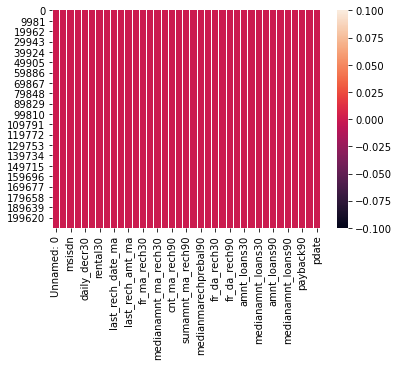

In [7]:
sns.heatmap(df.isnull())

Using Visualizing data plot to re-check null value and heatmap plot is showing their is no null value present in the dataset

In [8]:
# To get good overview of the dataset
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 209593 entries, 0 to 209592
Data columns (total 37 columns):
 #   Column                Non-Null Count   Dtype  
---  ------                --------------   -----  
 0   Unnamed: 0            209593 non-null  int64  
 1   label                 209593 non-null  int64  
 2   msisdn                209593 non-null  object 
 3   aon                   209593 non-null  float64
 4   daily_decr30          209593 non-null  float64
 5   daily_decr90          209593 non-null  float64
 6   rental30              209593 non-null  float64
 7   rental90              209593 non-null  float64
 8   last_rech_date_ma     209593 non-null  float64
 9   last_rech_date_da     209593 non-null  float64
 10  last_rech_amt_ma      209593 non-null  int64  
 11  cnt_ma_rech30         209593 non-null  int64  
 12  fr_ma_rech30          209593 non-null  float64
 13  sumamnt_ma_rech30     209593 non-null  float64
 14  medianamnt_ma_rech30  209593 non-null  float64
 15  

In [9]:
df.nunique()

Unnamed: 0              209593
label                        2
msisdn                  186243
aon                       4507
daily_decr30            147025
daily_decr90            158669
rental30                132148
rental90                141033
last_rech_date_ma         1186
last_rech_date_da         1174
last_rech_amt_ma            70
cnt_ma_rech30               71
fr_ma_rech30              1083
sumamnt_ma_rech30        15141
medianamnt_ma_rech30       510
medianmarechprebal30     30428
cnt_ma_rech90              110
fr_ma_rech90                89
sumamnt_ma_rech90        31771
medianamnt_ma_rech90       608
medianmarechprebal90     29785
cnt_da_rech30             1066
fr_da_rech30              1072
cnt_da_rech90               27
fr_da_rech90                46
cnt_loans30                 40
amnt_loans30                48
maxamnt_loans30           1050
medianamnt_loans30           6
cnt_loans90               1110
amnt_loans90                69
maxamnt_loans90              3
medianam

In [10]:
# checking duplicates values in dataset:
df.duplicated().sum()

0

#### Data Cleaning

In [11]:
# drop uncessary columns
df.drop(columns=['Unnamed: 0','pcircle'],axis=1,inplace=True)

df.drop('msisdn',axis=1,inplace=True)

In [12]:
# Taking days and month from pdate because years are same in all data is 2016
df['pmonth']=pd.to_datetime(df['pdate'],format="%Y-%m-%d").dt.month
df['pday']=pd.to_datetime(df['pdate'],format="%Y-%m-%d").dt.day
df.drop('pdate',axis=1,inplace=True)

In [13]:
# drop that columns have maximun zero values
df.drop(columns=['medianamnt_loans90','medianamnt_loans30','fr_da_rech90','last_rech_date_da','cnt_da_rech30','fr_da_rech30','cnt_da_rech90'],axis=1,inplace=True)

### Summary Statistics

In [14]:
df.describe()

,label,aon,daily_decr30,daily_decr90,rental30,rental90,last_rech_date_ma,last_rech_amt_ma,cnt_ma_rech30,fr_ma_rech30,sumamnt_ma_rech30,medianamnt_ma_rech30,medianmarechprebal30,cnt_ma_rech90,fr_ma_rech90,sumamnt_ma_rech90,medianamnt_ma_rech90,medianmarechprebal90,cnt_loans30,amnt_loans30,maxamnt_loans30,cnt_loans90,amnt_loans90,maxamnt_loans90,payback30,payback90,pmonth,pday
count,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593.00000,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593.00000
mean,0.875177,8112.343445,5381.402289,6082.515068,2692.581910,3483.406534,3755.847800,2064.452797,3.978057,3737.355121,7704.501157,1812.817952,3851.927942,6.31543,7.716780,12396.218352,1864.595821,92.025541,2.758981,17.952021,274.658747,18.520919,23.645398,6.703134,3.398826,4.321485,6.797321,14.39894
std,0.330519,75696.082531,9220.623400,10918.812767,4308.586781,5770.461279,53905.892230,2370.786034,4.256090,53643.625172,10139.621714,2070.864620,54006.374433,7.19347,12.590251,16857.793882,2081.680664,369.215658,2.554502,17.379741,4245.264648,224.797423,26.469861,2.103864,8.813729,10.308108,0.741435,8.43890
min,0.000000,-48.000000,-93.012667,-93.012667,-23737.140000,-24720.580000,-29.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-200.000000,0.00000,0.000000,0.000000,0.000000,-200.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,6.000000,1.00000
25%,1.000000,246.000000,42.440000,42.692000,280.420000,300.260000,1.000000,770.000000,1.000000,0.000000,1540.000000,770.000000,11.000000,2.00000,0.000000,2317.000000,773.000000,14.600000,1.000000,6.000000,6.000000,1.000000,6.000000,6.000000,0.000000,0.000000,6.000000,7.00000
50%,1.000000,527.000000,1469.175667,1500.000000,1083.570000,1334.000000,3.000000,1539.000000,3.000000,2.000000,4628.000000,1539.000000,33.900000,4.00000,2.000000,7226.000000,1539.000000,36.000000,2.000000,12.000000,6.000000,2.000000,12.000000,6.000000,0.000000,1.666667,7.000000,14.00000
75%,1.000000,982.000000,7244.000000,7802.790000,3356.940000,4201.790000,7.000000,2309.000000,5.000000,6.000000,10010.000000,1924.000000,83.000000,8.00000,8.000000,16000.000000,1924.000000,79.310000,4.000000,24.000000,6.000000,5.000000,30.000000,6.000000,3.750000,4.500000,7.000000,21.00000
max,1.000000,999860.755168,265926.000000,320630.000000,198926.110000,200148.110000,998650.377733,55000.000000,203.000000,999606.368132,810096.000000,55000.000000,999479.419319,336.00000,88.000000,953036.000000,55000.000000,41456.500000,50.000000,306.000000,99864.560864,4997.517944,438.000000,12.000000,171.500000,171.500000,8.000000,31.00000


#### Median and maximum amount of loan taken by the user in last 30 days:

In [15]:
df.loc[(df['maxamnt_loans30']!=6.0)&(df['maxamnt_loans30']!=12.0)&(df['maxamnt_loans30']!=0.0),'maxamnt_loans30']

118       61907.697372
125       22099.413732
146       98745.934048
369       58925.364061
374       78232.464324
499       28574.830964
520       71532.935430
645       83207.495583
887       34044.361979
1091      43221.389235
1142       6041.731394
1201      27793.098567
1930      55723.858041
2030       6721.146132
2520      45683.595975
3073      56383.080492
3378      81942.467056
3751      86416.878765
3754      45073.630216
3879      37341.425477
4299      75689.411348
5868      14453.317604
5901      31906.326993
6078      30423.104698
6095      98416.189192
6139      92891.354661
6146      11721.237167
6205      59472.558915
6334      73539.025803
6897      64645.934675
7186      18091.746969
7355      81260.829943
7889      23483.269628
8122      19232.601189
8123      40618.875959
8204      81381.021186
8255      67464.429120
8303      89559.216166
9043      20338.052234
9188      13261.479515
9679      55523.246463
9793      51790.857423
10126     11466.779886
10151     1

In [16]:
df.loc[(df['maxamnt_loans30']!=6.0) & (df['maxamnt_loans30']!=12.0) &(df['maxamnt_loans30']!=0.0),'maxamnt_loans30']=0.0

In [17]:
# maximum amount of loan taken by the user in last 30 days:

df['maxamnt_loans30'].value_counts()

6.0     179193
12.0     26109
0.0       4291
Name: maxamnt_loans30, dtype: int64

In [18]:
# maximum amount of loan taken by the user in last 90 days

df['maxamnt_loans90'].value_counts()

6     180945
12     26605
0       2043
Name: maxamnt_loans90, dtype: int64

In [19]:
# amnt_loan30 have 0 values mean that people not take laon so they not count in defualter or non-defualter:
df.drop(df[df['amnt_loans30']==0].index,inplace=True)

In [20]:
numerical_features=[feature for feature in df.columns if df[feature].dtypes != 'O']
print(numerical_features)

['label', 'aon', 'daily_decr30', 'daily_decr90', 'rental30', 'rental90', 'last_rech_date_ma', 'last_rech_amt_ma', 'cnt_ma_rech30', 'fr_ma_rech30', 'sumamnt_ma_rech30', 'medianamnt_ma_rech30', 'medianmarechprebal30', 'cnt_ma_rech90', 'fr_ma_rech90', 'sumamnt_ma_rech90', 'medianamnt_ma_rech90', 'medianmarechprebal90', 'cnt_loans30', 'amnt_loans30', 'maxamnt_loans30', 'cnt_loans90', 'amnt_loans90', 'maxamnt_loans90', 'payback30', 'payback90', 'pmonth', 'pday']


#### Univariate Analysis

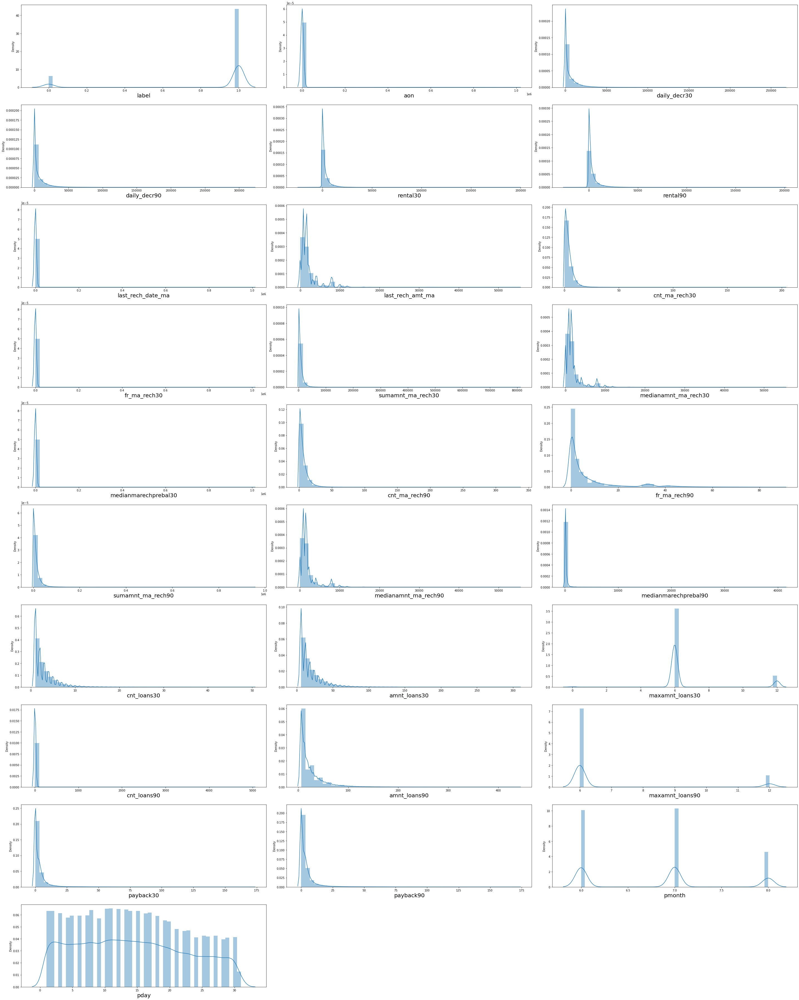

In [21]:
# distribution plot of numerical features
plt.figure(figsize=(40,50))
plotnumber=1
for column in numerical_features:
    if plotnumber <=30:
        ax=plt.subplot(10,3,plotnumber)
        sns.distplot(df[column])
        plt.xlabel(column,fontsize=20)
    plotnumber+=1
plt.tight_layout()

<AxesSubplot:xlabel='label', ylabel='count'>

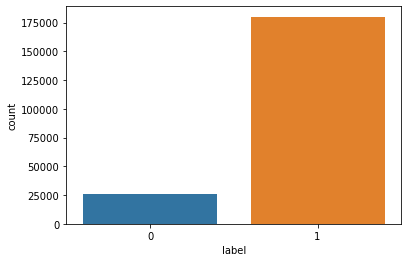

In [22]:
#count for target column
sns.countplot(df['label'])

#### Bivariate Analysis

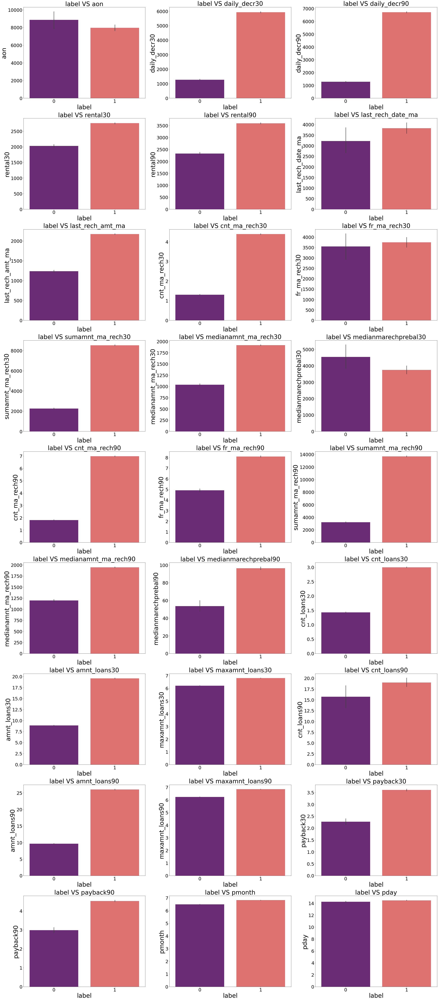

In [23]:
# Relation between target and other column :

col=['aon', 'daily_decr30', 'daily_decr90', 'rental30', 'rental90', 'last_rech_date_ma', 'last_rech_amt_ma', 'cnt_ma_rech30', 'fr_ma_rech30', 'sumamnt_ma_rech30', 'medianamnt_ma_rech30', 'medianmarechprebal30', 'cnt_ma_rech90', 'fr_ma_rech90', 'sumamnt_ma_rech90', 'medianamnt_ma_rech90', 'medianmarechprebal90', 'cnt_loans30', 'amnt_loans30', 'maxamnt_loans30', 'cnt_loans90', 'amnt_loans90', 'maxamnt_loans90', 'payback30', 'payback90', 'pmonth', 'pday']

plt.figure(figsize=(40,100))
for i in range(len(col)):
    plt.subplot(10,3,i+1)
    sns.barplot(x=df['label'],y=df[col[i]],palette='magma')
    plt.title(f"label VS {col[i]}",fontsize=40)
    plt.xticks(fontsize=30)  
    plt.yticks(fontsize=30)
    plt.xlabel('label',fontsize = 40)
    plt.ylabel(col[i],fontsize = 40)
    plt.tight_layout()

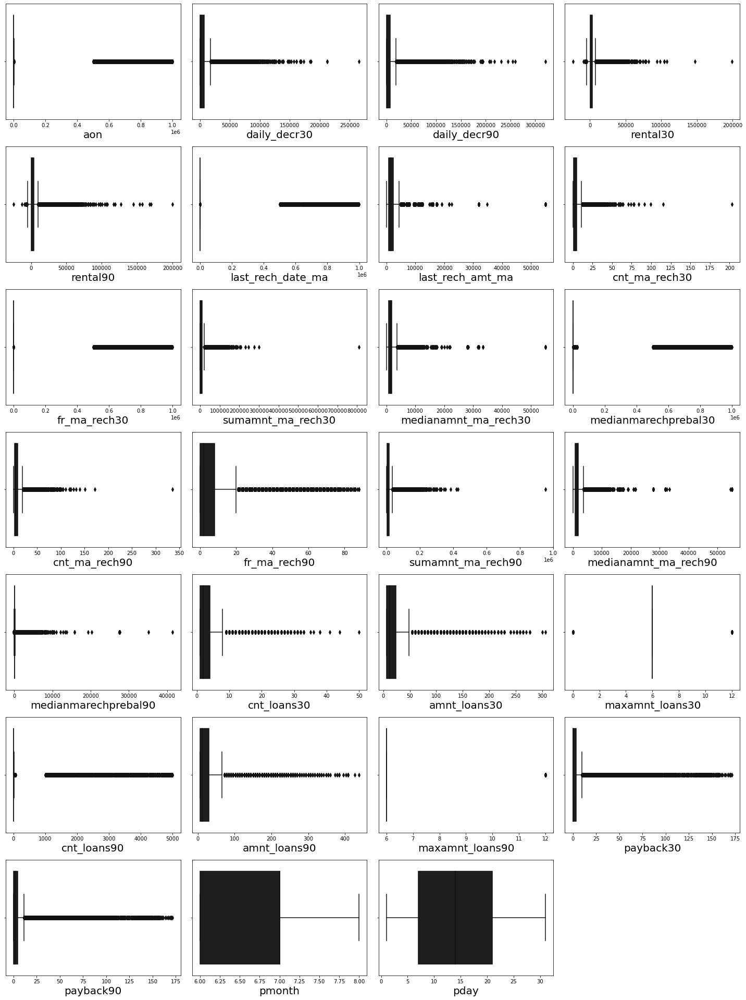

In [24]:
# Traget varible vs other column :

plt.figure(figsize=(20,30))
for i in range(len(col)):
    plt.subplot(8,4,i+1)
    sns.boxplot(df[col[i]], palette='icefire')
    plt.xlabel(col[i],fontsize =20)
    plt.tight_layout()

#### Correlation

Text(0.5, 1.0, 'Correlation with target Variable that is label column')

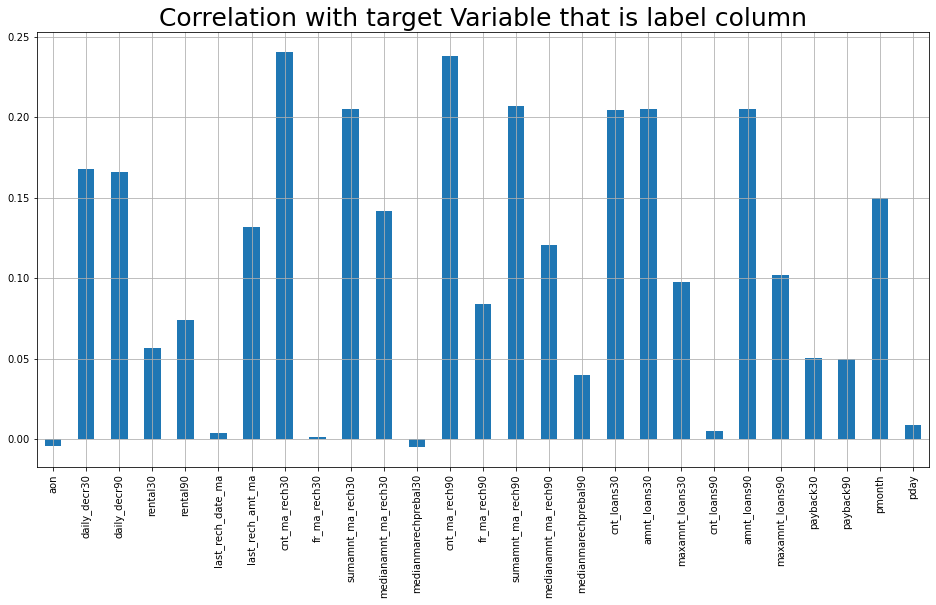

In [25]:
#Checking the correlation with target variable
plt.figure(figsize=(16,8))
df.drop('label', axis=1).corrwith(df['label']).plot(kind='bar',grid=True)
plt.xticks(rotation='vertical')
plt.title("Correlation with target Variable that is label column",fontsize=25)

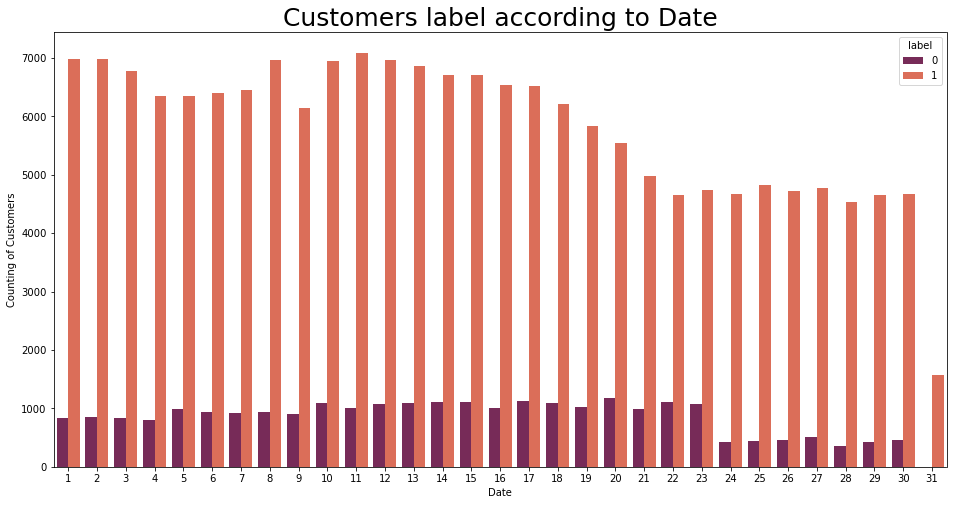

In [26]:
#Customer label according to per day:
plt.figure(figsize=(16,8))
sns.countplot(x="pday", hue='label', data=df, palette='rocket')
plt.title("Customers label according to Date", fontsize=25)
plt.xlabel('Date')
plt.ylabel('Counting of Customers')
plt.show()

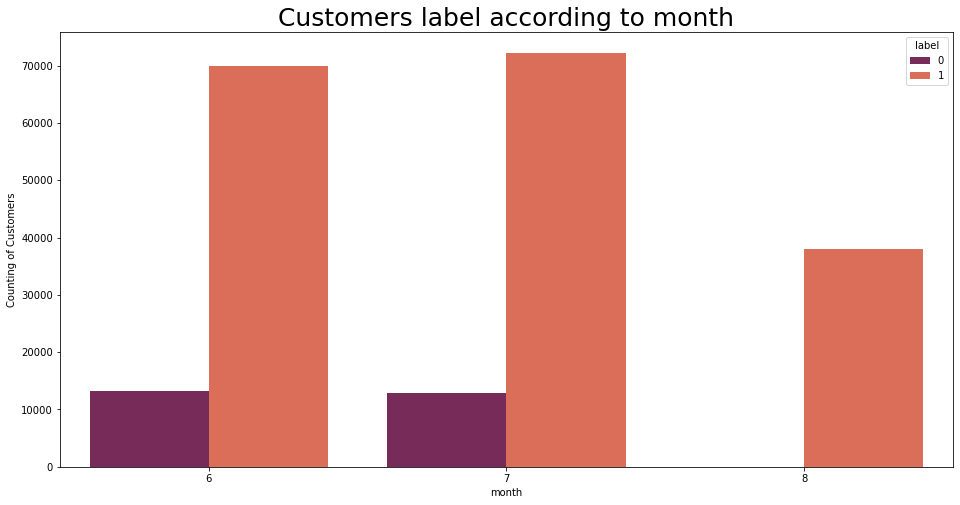

In [27]:
#Customer label according to month (date):
plt.figure(figsize=(16,8))
sns.countplot(x="pmonth", hue='label', data=df, palette='rocket')
plt.title("Customers label according to month", fontsize=25)
plt.xlabel('month')
plt.ylabel('Counting of Customers')
plt.show()

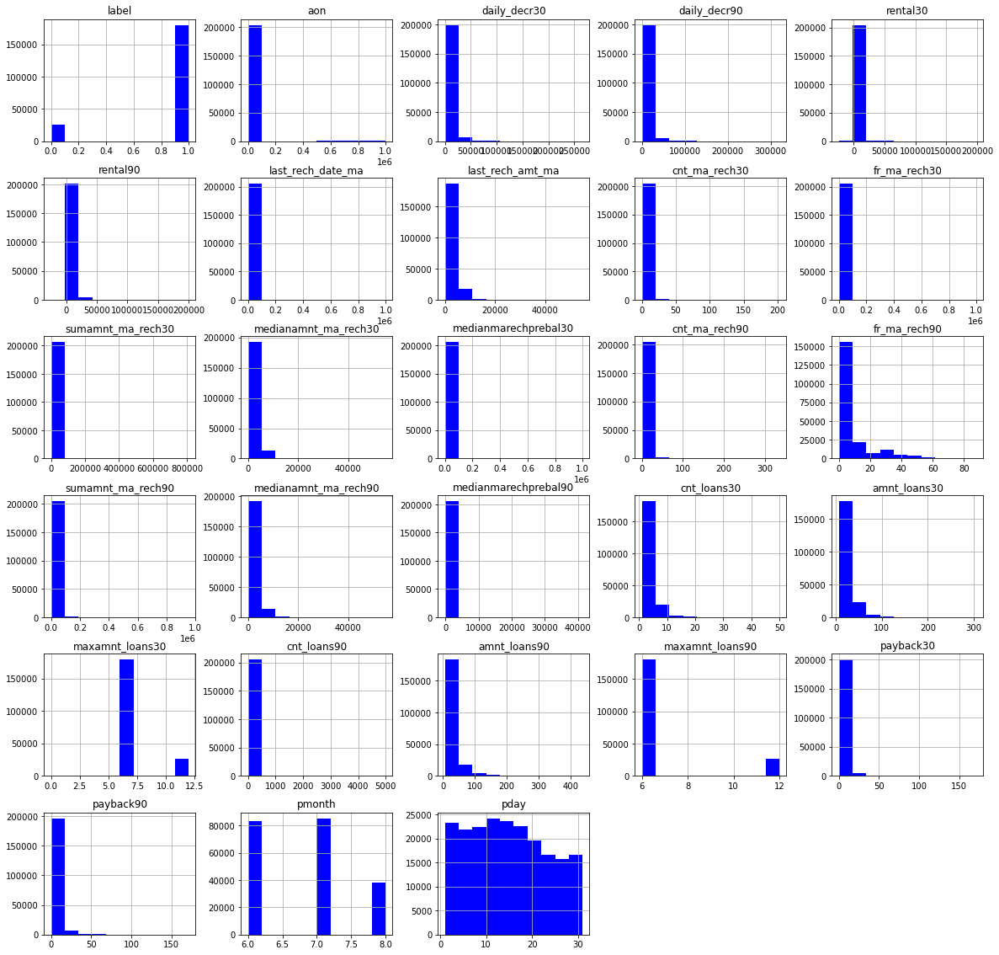

In [28]:
#Plotting the Histogram
df.hist(figsize=(20,20),color='b')
plt.show()

### Remove outliers

In [29]:
# feature contain outliers
featr=df[['aon', 'daily_decr30', 'daily_decr90', 'rental30', 'rental90', 'last_rech_date_ma', 'last_rech_amt_ma', 'cnt_ma_rech30', 'fr_ma_rech30', 'sumamnt_ma_rech30', 'medianamnt_ma_rech30', 'medianmarechprebal30', 'cnt_ma_rech90', 'fr_ma_rech90', 'sumamnt_ma_rech90', 'medianamnt_ma_rech90', 'medianmarechprebal90', 'cnt_loans30', 'amnt_loans30', 'maxamnt_loans30', 'cnt_loans90', 'amnt_loans90', 'maxamnt_loans90', 'payback30', 'payback90', 'pmonth', 'pday']]

#### Z-score

In [30]:
z_score = zscore(df[['label']])
abs_zscore = np.abs(z_score)

filtering_entry = (abs_zscore < 3).all(axis=1)

df = df[filtering_entry]



# the data now seems much better than before.

df.describe()

,label,aon,daily_decr30,daily_decr90,rental30,rental90,last_rech_date_ma,last_rech_amt_ma,cnt_ma_rech30,fr_ma_rech30,sumamnt_ma_rech30,medianamnt_ma_rech30,medianmarechprebal30,cnt_ma_rech90,fr_ma_rech90,sumamnt_ma_rech90,medianamnt_ma_rech90,medianmarechprebal90,cnt_loans30,amnt_loans30,maxamnt_loans30,cnt_loans90,amnt_loans90,maxamnt_loans90,payback30,payback90,pmonth,pday
count,206334.000000,206334.000000,206334.000000,206334.000000,206334.000000,206334.000000,206334.000000,206334.000000,206334.000000,206334.000000,206334.000000,206334.000000,206334.000000,206334.000000,206334.000000,206334.000000,206334.000000,206334.000000,206334.000000,206334.000000,206334.000000,206334.000000,206334.000000,206334.000000,206334.000000,206334.000000,206334.000000,206334.000000
mean,0.873206,8083.775238,5336.954688,6021.166259,2664.367446,3431.671363,3747.842543,2051.860580,4.000456,3724.804106,7731.297178,1805.752930,3849.893493,6.324479,7.689009,12365.575780,1851.747291,90.918915,2.802558,18.235570,6.729216,18.603369,23.949897,6.772514,3.435019,4.324737,6.781485,14.448360
std,0.332743,75547.449680,9212.622214,10903.651687,4262.266027,5690.281853,53835.726141,2359.664033,4.270021,53578.005363,10169.034127,2061.616606,53984.258711,7.212902,12.587183,16857.398281,2067.431394,355.948133,2.550769,17.368237,2.050286,224.999624,26.547094,2.009559,8.813884,10.250851,0.734527,8.411229
min,0.000000,-48.000000,-93.012667,-93.012667,-23737.140000,-24720.580000,-29.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-200.000000,0.000000,0.000000,0.000000,0.000000,-200.000000,1.000000,6.000000,0.000000,1.000000,6.000000,6.000000,0.000000,0.000000,6.000000,1.000000
25%,1.000000,246.000000,41.300000,41.484667,276.130000,299.700000,1.000000,770.000000,1.000000,0.000000,1543.000000,770.000000,11.000000,2.000000,0.000000,2316.000000,773.000000,14.500000,1.000000,6.000000,6.000000,1.000000,6.000000,6.000000,0.000000,0.000000,6.000000,7.000000
50%,1.000000,526.000000,1389.035667,1407.000000,1070.795000,1308.900000,3.000000,1539.000000,3.000000,2.000000,4629.000000,1539.000000,33.800000,4.000000,2.000000,7145.000000,1539.000000,35.800000,2.000000,12.000000,6.000000,2.000000,12.000000,6.000000,0.000000,1.705882,7.000000,14.000000
75%,1.000000,981.000000,7170.000000,7671.877500,3314.222500,4136.532500,7.000000,2309.000000,5.000000,6.000000,10015.000000,1924.000000,83.000000,9.000000,8.000000,16000.000000,1924.000000,79.000000,4.000000,24.000000,6.000000,5.000000,30.000000,6.000000,3.800000,4.500000,7.000000,21.000000
max,1.000000,999860.755168,265926.000000,320630.000000,198926.110000,200148.110000,998650.377733,55000.000000,203.000000,999606.368132,810096.000000,55000.000000,999479.419319,336.000000,88.000000,953036.000000,55000.000000,41456.500000,50.000000,306.000000,12.000000,4997.517944,438.000000,12.000000,171.500000,171.500000,8.000000,31.000000


So, from the above we can see that we have somewhat cleaned the datset and now we will proceed for model building.

#### Z-score Analysis

In [31]:
# Z-score
from scipy.stats import zscore
z=np.abs(zscore(featr))
df_new=df[(z<3).all(axis=1)]
df_new.shape

(166096, 28)

In [32]:
#Seprate the categorical columns and Numerical columns
cat_df,num_df=[],[]

for i in df.columns:
    if df[i].dtype==object:
        cat_df.append(i)
    elif (df[i].dtypes=='int64') | (df[i].dtypes=='float64') | (df[i].dtypes=='int32'):
        num_df.append(i)
    else: continue
        
print('Total Number of Feature::', df.shape[1])
print('Number of categorical features::', len(cat_df))
print('Number of Numerical Feature::', len(num_df))

Total Number of Feature:: 28
Number of categorical features:: 0
Number of Numerical Feature:: 28


In [33]:
corr_matrix = df.corr()
corr_matrix["label"].sort_values(ascending=False)

label                   1.000000
cnt_ma_rech30           0.240686
cnt_ma_rech90           0.238356
sumamnt_ma_rech90       0.206958
amnt_loans30            0.205401
amnt_loans90            0.205371
sumamnt_ma_rech30       0.205067
cnt_loans30             0.204850
daily_decr30            0.168122
daily_decr90            0.165735
pmonth                  0.149599
medianamnt_ma_rech30    0.142099
last_rech_amt_ma        0.131584
medianamnt_ma_rech90    0.120416
maxamnt_loans90         0.102042
maxamnt_loans30         0.097551
fr_ma_rech90            0.084324
rental90                0.073810
rental30                0.056722
payback30               0.050335
payback90               0.050024
medianmarechprebal90    0.039947
pday                    0.009148
cnt_loans90             0.004911
last_rech_date_ma       0.003710
fr_ma_rech30            0.001255
aon                    -0.003971
medianmarechprebal30   -0.004889
Name: label, dtype: float64

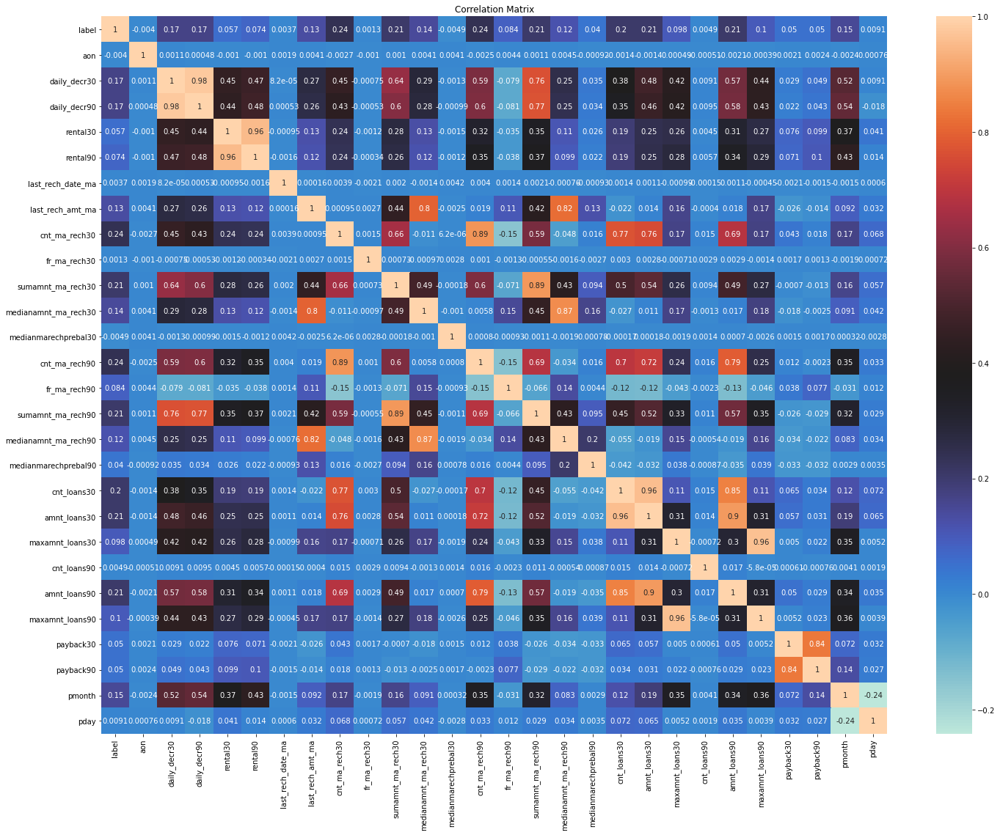

In [34]:
plt.figure(figsize=(24,18))
sns.heatmap(corr_matrix, annot=True, cmap='icefire')
plt.title("Correlation Matrix")
plt.show()

In [35]:
x = df.drop(columns = ["label"], axis=1)
y = df["label"]

x.skew()

aon                     10.412316
daily_decr30             3.965795
daily_decr90             4.284159
rental30                 4.468993
rental90                 4.379261
last_rech_date_ma       14.802413
last_rech_amt_ma         3.838389
cnt_ma_rech30            3.276838
fr_ma_rech30            14.800651
sumamnt_ma_rech30        6.402651
medianamnt_ma_rech30     3.553197
medianmarechprebal30    14.778444
cnt_ma_rech90            3.427664
fr_ma_rech90             2.290585
sumamnt_ma_rech90        4.923172
medianamnt_ma_rech90     3.799376
medianmarechprebal90    45.512392
cnt_loans30              2.737129
amnt_loans30             2.997192
maxamnt_loans30          1.933942
cnt_loans90             16.573289
amnt_loans90             3.145134
maxamnt_loans90          2.216911
payback30                8.265049
payback90                6.897933
pmonth                   0.367412
pday                     0.175518
dtype: float64

#### Skewness

In [36]:
# Remove skewness
fetr=['aon', 'daily_decr30', 'daily_decr90', 'rental30', 'rental90', 'last_rech_date_ma', 'last_rech_amt_ma', 'cnt_ma_rech30', 'fr_ma_rech30', 'sumamnt_ma_rech30', 'medianamnt_ma_rech30', 'medianmarechprebal30', 'cnt_ma_rech90', 'fr_ma_rech90', 'sumamnt_ma_rech90', 'medianamnt_ma_rech90', 'medianmarechprebal90', 'cnt_loans30', 'amnt_loans30', 'maxamnt_loans30', 'cnt_loans90', 'amnt_loans90', 'maxamnt_loans90', 'payback30', 'payback90']

In [37]:
pt = PowerTransformer(method='yeo-johnson')

df[fetr] = pt.fit_transform(df[fetr].values)

In [38]:
df[fetr].skew()

aon                     1.681185
daily_decr30           -6.827117
daily_decr90           -7.346018
rental30               -1.002671
rental90               -0.982559
last_rech_date_ma      -5.330198
last_rech_amt_ma       -0.064244
cnt_ma_rech30          -0.000629
fr_ma_rech30            0.162386
sumamnt_ma_rech30      -0.290936
medianamnt_ma_rech30   -0.187796
medianmarechprebal30   -0.135088
cnt_ma_rech90          -0.002572
fr_ma_rech90            0.145152
sumamnt_ma_rech90      -0.194656
medianamnt_ma_rech90   -0.048127
medianmarechprebal90    7.467146
cnt_loans30             0.223040
amnt_loans30            0.148341
maxamnt_loans30         0.233352
cnt_loans90             0.232384
amnt_loans90            0.132503
maxamnt_loans90         0.000000
payback30               0.283898
payback90               0.202892
dtype: float64

<AxesSubplot:>

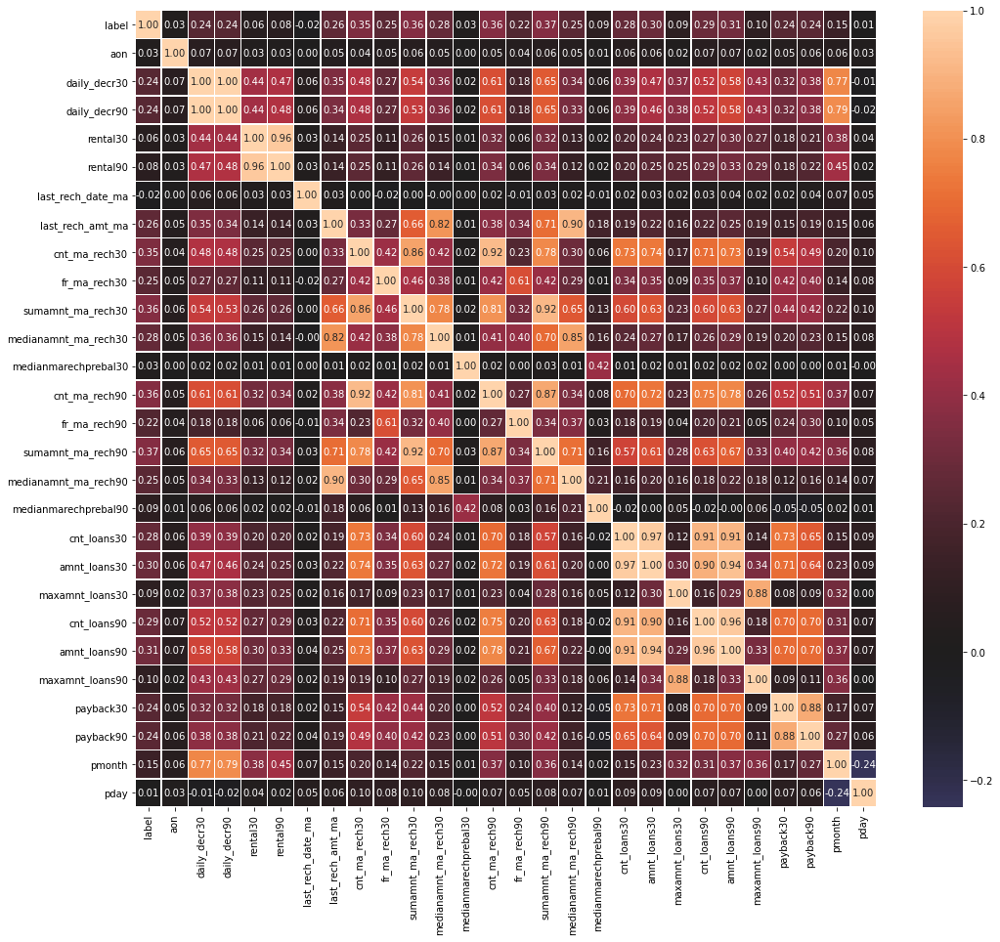

In [39]:
plt.figure(figsize=(17,15))
sns.heatmap(df.corr(),annot=True,center=0,linewidth=0.5,fmt='0.2f')

[1.26794421 0.         0.         0.         0.         0.
 0.         0.         0.         8.73205579]
[0.  0.1 0.2 0.3 0.4 0.5 0.6 0.7 0.8 0.9 1. ]


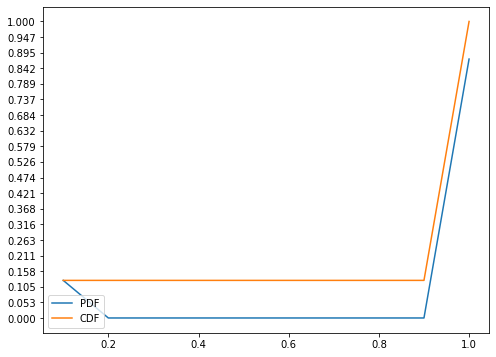

In [40]:
df_Price=df.loc[:,"label"]
count,bin_edges=np.histogram(df_Price,bins=10,density=True)  #density=True gives normalized form od bin_edges and count
print(count)
print(bin_edges)
PDF=count/sum(count)
CDF=np.cumsum(PDF)  #cdf is sum of all pdf values
plt.figure(figsize=(8,6))
plt.plot(bin_edges[1:],PDF,label="PDF")
plt.plot(bin_edges[1:],CDF,label="CDF")
plt.yticks(np.linspace(0,1,20))
plt.legend(loc="lower left")
plt.show()

#### Train - Test split:

In [41]:
x=df.drop('label',axis=1)
y=df['label']

y.value_counts()

1    180172
0     26162
Name: label, dtype: int64

In [42]:
scaler=MinMaxScaler()
x1 = pd.DataFrame(scaler.fit_transform(x), columns=x.columns)
x1.head()

,aon,daily_decr30,daily_decr90,rental30,rental90,last_rech_date_ma,last_rech_amt_ma,cnt_ma_rech30,fr_ma_rech30,sumamnt_ma_rech30,medianamnt_ma_rech30,medianmarechprebal30,cnt_ma_rech90,fr_ma_rech90,sumamnt_ma_rech90,medianamnt_ma_rech90,medianmarechprebal90,cnt_loans30,amnt_loans30,maxamnt_loans30,cnt_loans90,amnt_loans90,maxamnt_loans90,payback30,payback90,pmonth,pday
0,0.534888,0.966544,0.967049,0.725917,0.769170,0.610111,0.266866,0.204521,0.663372,0.171604,0.261516,0.506226,0.181596,0.804369,0.173906,0.254094,0.122086,0.330789,0.309809,0.70073,0.255334,0.267245,0.0,0.893891,0.851513,0.5,0.633333
1,0.546035,0.973303,0.973331,0.734437,0.776447,0.619771,0.439121,0.128915,0.000000,0.211218,0.433461,0.508777,0.114196,0.000000,0.212655,0.425543,0.126996,0.000000,0.309809,1.00000,0.000000,0.267245,1.0,0.000000,0.000000,1.0,0.300000
2,0.542323,0.963612,0.964289,0.727894,0.770787,0.611248,0.266866,0.128915,0.000000,0.136007,0.261516,0.508945,0.114196,0.000000,0.138802,0.254094,0.127400,0.000000,0.000000,0.70073,0.000000,0.000000,0.0,0.000000,0.000000,1.0,0.600000
3,0.533735,0.954757,0.955891,0.725712,0.768873,0.624583,0.221390,0.000000,0.000000,0.000000,0.000000,0.505233,0.114196,0.000000,0.118102,0.209477,0.121403,0.330789,0.309809,0.70073,0.255334,0.267245,0.0,0.000000,0.000000,0.0,0.166667
4,0.550130,0.957780,0.958780,0.728417,0.771242,0.612192,0.311339,0.388016,0.319618,0.315115,0.305767,0.507546,0.366461,0.363731,0.328835,0.325213,0.124863,0.762466,0.698102,0.70073,0.635768,0.632673,0.0,0.505471,0.437250,0.0,0.700000


In [43]:
#Using Train-Test split:

x_train,x_test,y_train,y_test=train_test_split(x1,y,test_size=.30,random_state=42)

x_train.shape

(144433, 27)

#### VIF (Inspect VIF Factors)

In [44]:
# For each X, calculate VIF and save in dataframe


vif = pd.DataFrame()
vif["VIF Factor"] = [variance_inflation_factor(x1.values, i) for i in range(x1.shape[1])]
vif["features"] = x.columns

vif.round(1)

,VIF Factor,features
0,110.3,aon
1,2650698.9,daily_decr30
2,2684678.2,daily_decr90
3,95568.6,rental30
4,96076.1,rental90
5,190.3,last_rech_date_ma
6,33.5,last_rech_amt_ma
7,218.1,cnt_ma_rech30
8,4.5,fr_ma_rech30
9,412.2,sumamnt_ma_rech30


### Accuracy_score of train-test

In [45]:
lg=LogisticRegression()
grid={'C':10.0**np.arange(-2,3),'penalty':['l1','l2']}
cv=KFold(n_splits=5,shuffle=False,random_state=None)
clf=GridSearchCV(lg,grid,cv=cv,n_jobs=-1,scoring='f1_macro')
clf.fit(x_train,y_train)

GridSearchCV(cv=KFold(n_splits=5, random_state=None, shuffle=False),
             estimator=LogisticRegression(), n_jobs=-1,
             param_grid={'C': array([1.e-02, 1.e-01, 1.e+00, 1.e+01, 1.e+02]),
                         'penalty': ['l1', 'l2']},
             scoring='f1_macro')

In [46]:
y_pred=clf.predict(x_test)
print(accuracy_score(y_test,y_pred))
print(confusion_matrix(y_test,y_pred))
print(classification_report(y_test,y_pred))

0.8782087526857402
[[  862  6943]
 [  596 53500]]
              precision    recall  f1-score   support

           0       0.59      0.11      0.19      7805
           1       0.89      0.99      0.93     54096

    accuracy                           0.88     61901
   macro avg       0.74      0.55      0.56     61901
weighted avg       0.85      0.88      0.84     61901



#### Resampling:
A widely adopted technique for dealing with highly unbalanced datasets is called resampling. It consists of removing samples from the majority class (under-sampling) and / or adding more examples from the minority class (over-sampling).

In [47]:
# Apply smote for inbalance dataset

sm=SMOTETomek(0.9)
X_train_sm,Y_train_sm=sm.fit_resample(x_train,y_train)
print('before under resampling{}'.format(Counter(y_train)))
print('after under resampling{}'.format(Counter(Y_train_sm)))

before under resamplingCounter({1: 126076, 0: 18357})
after under resamplingCounter({1: 124612, 0: 112004})


#### For understanding sampling, Random sampling uses SMOTETomek for better result
SMOTE (Synthetic Minority Oversampling TEchnique) consists of synthesizing elements for the minority class, based on those that already exist. It works randomly picingk a point from the minority class and computing the k-nearest neighbors for this point. The synthetic points are added between the chosen point and its neighbors.

Text(0.5, 1.0, 'After resampling dataset')

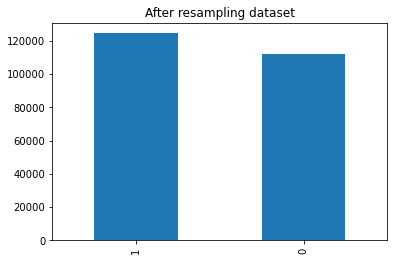

In [48]:
Y_train_sm.value_counts().plot(kind='bar')
plt.title('After resampling dataset')

In [49]:
clf.fit(X_train_sm,Y_train_sm)
y_pred=clf.predict(x_test)
print(accuracy_score(y_test,y_pred))
print(confusion_matrix(y_test,y_pred))
print(classification_report(y_test,y_pred))

0.7570798533141629
[[ 5860  1945]
 [13092 41004]]
              precision    recall  f1-score   support

           0       0.31      0.75      0.44      7805
           1       0.95      0.76      0.85     54096

    accuracy                           0.76     61901
   macro avg       0.63      0.75      0.64     61901
weighted avg       0.87      0.76      0.79     61901



### Models:

In [50]:
dtc=DecisionTreeClassifier()
sgd=SGDClassifier()
xgb=XGBClassifier(eval_metric='logloss')

In [51]:
def classifiers(f):
    f.fit(X_train_sm,Y_train_sm)
    print(f,'\n',f.score(X_train_sm,Y_train_sm)*100)
    f_pred=f.predict(x_test)
    scores=cross_val_score(f,X_train_sm,Y_train_sm,cv=5).mean()*100
    print('\n cross value score',scores)
    print('ACCURACY SCORE:\n',accuracy_score(y_test,f_pred)*100)
    print('ROC AUC SCORE:\n',roc_auc_score(y_test,f_pred)*100)
    print('CONFUSION MATRIX:\n',confusion_matrix(y_test,f_pred))
    print('CLASSIFICATION REPORT:\n',classification_report(y_test,f_pred))
    return

#### Decision Tree Classifier

In [52]:
classifiers(dtc)

DecisionTreeClassifier() 
 99.99915474862225

 cross value score 90.5403979470807
ACCURACY SCORE:
 87.28453498327976
ROC AUC SCORE:
 76.75629142278865
CONFUSION MATRIX:
 [[ 4892  2913]
 [ 4958 49138]]
CLASSIFICATION REPORT:
               precision    recall  f1-score   support

           0       0.50      0.63      0.55      7805
           1       0.94      0.91      0.93     54096

    accuracy                           0.87     61901
   macro avg       0.72      0.77      0.74     61901
weighted avg       0.89      0.87      0.88     61901



#### SGD Classifier

In [53]:
classifiers(sgd)

SGDClassifier() 
 75.52490110558881

 cross value score 75.5003889746326
ACCURACY SCORE:
 77.57709891601104
ROC AUC SCORE:
 74.38724115109096
CONFUSION MATRIX:
 [[ 5473  2332]
 [11548 42548]]
CLASSIFICATION REPORT:
               precision    recall  f1-score   support

           0       0.32      0.70      0.44      7805
           1       0.95      0.79      0.86     54096

    accuracy                           0.78     61901
   macro avg       0.63      0.74      0.65     61901
weighted avg       0.87      0.78      0.81     61901



#### XGB Classifier

In [54]:
classifiers(xgb)

XGBClassifier(base_score=0.5, booster='gbtree', callbacks=None,
              colsample_bylevel=1, colsample_bynode=1, colsample_bytree=1,
              early_stopping_rounds=None, enable_categorical=False,
              eval_metric='logloss', gamma=0, gpu_id=-1,
              grow_policy='depthwise', importance_type=None,
              interaction_constraints='', learning_rate=0.300000012,
              max_bin=256, max_cat_to_onehot=4, max_delta_step=0, max_depth=6,
              max_leaves=0, min_child_weight=1, missing=nan,
              monotone_constraints='()', n_estimators=100, n_jobs=0,
              num_parallel_tree=1, predictor='auto', random_state=0,
              reg_alpha=0, reg_lambda=1, ...) 
 95.17023362748081

 cross value score 93.39610662931561
ACCURACY SCORE:
 91.15361625821878
ROC AUC SCORE:
 79.74289189257297
CONFUSION MATRIX:
 [[ 5033  2772]
 [ 2704 51392]]
CLASSIFICATION REPORT:
               precision    recall  f1-score   support

           0       0.65   

In [55]:
ensemble=[RandomForestClassifier(),AdaBoostClassifier(),GradientBoostingClassifier(),BaggingClassifier()]
for i in ensemble:
    i.fit(X_train_sm,Y_train_sm)
    print(i,'\n score: ',i.score(X_train_sm,Y_train_sm)*100)
    pred=i.predict(x_test)
    print(' F1 score:',f1_score(y_test,pred)*100)
    print('Accuracy scoer:',accuracy_score(y_test,pred)*100)
    scores=cross_val_score(i,X_train_sm,Y_train_sm,cv=5).mean()*100
    print('\n Cross value score',scores)
    print('Confusion_matrix:\n',confusion_matrix(y_test,pred))
    print('Classification report:\n',classification_report(y_test,pred))
    print('\n')

RandomForestClassifier() 
 score:  99.99873212293336
 F1 score: 94.78917837897893
Accuracy scoer: 90.90806287459007

 Cross value score 94.5895747904108
Confusion_matrix:
 [[ 5084  2721]
 [ 2907 51189]]
Classification report:
               precision    recall  f1-score   support

           0       0.64      0.65      0.64      7805
           1       0.95      0.95      0.95     54096

    accuracy                           0.91     61901
   macro avg       0.79      0.80      0.80     61901
weighted avg       0.91      0.91      0.91     61901



AdaBoostClassifier() 
 score:  85.2009162524935
 F1 score: 89.91074588133527
Accuracy scoer: 83.4186846739148

 Cross value score 85.13457947877694
Confusion_matrix:
 [[ 5903  1902]
 [ 8362 45734]]
Classification report:
               precision    recall  f1-score   support

           0       0.41      0.76      0.53      7805
           1       0.96      0.85      0.90     54096

    accuracy                           0.83     61901
   m

#### Hyperparameter Tuning

In [56]:
n_estimators=[int(x) for x in np.linspace(start=0,stop=100,num=10)]
max_features=['auto','sqrt','log2']
criterion=['gini','entropy']
max_depth=[2,4]
min_samples_split=[1,2]
bootstrap=[True,False]

In [57]:
para_grid={'n_estimators':n_estimators,
          'max_features':max_features,
          'criterion':criterion,
          'max_depth':max_depth,
          'min_samples_split':min_samples_split,
          'bootstrap':bootstrap}

In [58]:
grid=GridSearchCV(RandomForestClassifier(),para_grid,n_jobs=-1)
grid.fit(X_train_sm,Y_train_sm)
grid.best_params_

{'bootstrap': True,
 'criterion': 'gini',
 'max_depth': 4,
 'max_features': 'auto',
 'min_samples_split': 2,
 'n_estimators': 11}

### ROC & AUC SCORE:

In [59]:
rf=RandomForestClassifier(bootstrap=False,criterion='gini',max_depth=None,max_features='sqrt',min_samples_split=7,n_estimators=77)
rf.fit(X_train_sm,Y_train_sm)
pred_rf=rf.predict(x_test)
print(accuracy_score(y_test,pred_rf))
print(confusion_matrix(y_test,pred_rf))
print(classification_report(y_test,pred_rf))

0.9111646015411706
[[ 4908  2897]
 [ 2602 51494]]
              precision    recall  f1-score   support

           0       0.65      0.63      0.64      7805
           1       0.95      0.95      0.95     54096

    accuracy                           0.91     61901
   macro avg       0.80      0.79      0.80     61901
weighted avg       0.91      0.91      0.91     61901



In [60]:
y_pred_prob=rf.predict_proba(x_test)[:,1]

fpr,tpr,thresold=roc_curve(y_test,y_pred_prob)

ROC AUC SCORE:  79.03639999575577


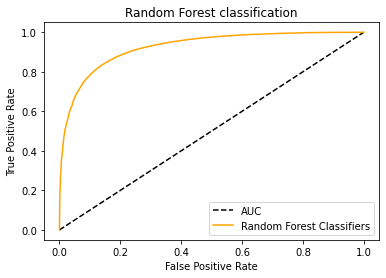

In [61]:
#Ploting ROC curve for final model

plt.plot([0,1],[0,1],'k--',label='AUC')
plt.plot(fpr,tpr,label='Random Forest Classifiers',color='orange',)
print("ROC AUC SCORE: ",roc_auc_score(y_test,pred_rf)*100)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Random Forest classification')
plt.legend()
plt.show()

### Saving best model

In [62]:
# Saving best model

import joblib

joblib.dump(rf,'Microcreditdefaulter.plk')

['Microcreditdefaulter.plk']

In [63]:
# Loading the saved model

model=joblib.load("Microcreditdefaulter.plk")

### Prediction

In [64]:
prediction = model.predict(x_test)
prediction=pd.DataFrame(prediction)
prediction

,0
0,1
1,1
2,1
3,1
4,1
5,1
6,1
7,0
8,1
9,1
